In [15]:
import scipy.io
import scipy.cluster.hierarchy as sch
from scipy import spatial

from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.preprocessing import normalize
from sklearn.model_selection import train_test_split

import pickle
import cv2
from matplotlib import pyplot as plt
from random import sample
import numpy as np
import pandas as pd
import h2o
from h2o.estimators import H2OGeneralizedLowRankEstimator

features_path = '../../datasets/EurosportCut/girosmallslow_cut.mp4_features.mat'
skel_path = '../../datasets/EurosportCut/esqueletosmallslow_cut.mat'
#skel_path = './datasets/EurosportAll/esqueletosveryslow.mat'
video_path = '../../datasets/EurosportCut/girosmallslow_cut.mp4'

In [16]:
mat1 = scipy.io.loadmat(skel_path)
mat2 = scipy.io.loadmat('../../datasets/EurosportCut/esqueletosmallslow_cut_complete.mat')
mat3 = scipy.io.loadmat(features_path)

In [17]:
mat1

{'__header__': b'MATLAB 5.0 MAT-file Platform: posix, Created on: Tue May  3 09:31:04 2022',
 '__version__': '1.0',
 '__globals__': [],
 'skeldata': array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         8.15100000e+03, 8.15300000e+03, 8.15700000e+03],
        [7.12962985e-01, 4.25925940e-01, 6.11111104e-01, ...,
         2.77777791e-01, 8.33333358e-02, 5.97222209e-01],
        [5.97826064e-01, 5.81521749e-01, 5.76086938e-01, ...,
         8.64130437e-01, 7.88043499e-01, 6.46739125e-01],
        ...,
        [7.22222209e-01, 4.49074060e-01, 6.15740716e-01, ...,
         2.77777791e-01, 8.79629627e-02, 0.00000000e+00],
        [5.92391312e-01, 5.70652187e-01, 5.70652187e-01, ...,
         8.58695626e-01, 7.82608688e-01, 0.00000000e+00],
        [5.85828781e-01, 7.48094976e-01, 3.27318221e-01, ...,
         1.45912036e-01, 3.00394177e-01, 0.00000000e+00]])}

In [18]:
mat2['skeldata'].shape

(55, 17326)

In [19]:
features = normalize(mat3['features'].T)
features.shape

(8169, 512)

# Step 1 - Statistical Analysis of the Data

We will begin this project by trying to segment the video in a meningful way. We first construct a dendrogram plot that will show us how this data can be clustered together

3

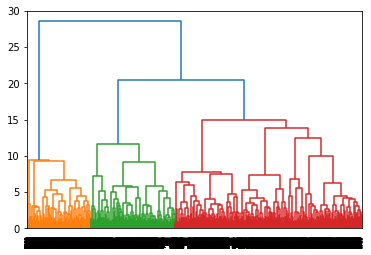

In [20]:
#visualize data clusters
dendrogram = sch.dendrogram(sch.linkage(features, method='ward'))
nbrClusters = len(set(dendrogram['leaves_color_list']))
nbrClusters

## Cluster Data
Now that we have a good approximation for the number of cluster we can apply the agglomarative clusterting algorithm and vizualise some of the data

In [21]:
#apply cluster
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward', compute_distances = True)
y_hc = hc.fit_predict(features)
y_hc.shape

(8169,)

In [22]:
def showImages(video :str, indices_P : list, rows=10, cols=5):
    cap = cv2.VideoCapture(video)
    img_count = 0
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,40))
    i = 0
    j = 0
    for i in range(rows):
        for j in range(cols):        
            if img_count < len(indices_P):
                cap.set(cv2.CAP_PROP_POS_FRAMES, indices_P[img_count])
                ret, frame = cap.read()
                axes[i, j].imshow(frame)
                img_count+=1
                
def printCluster(cluster, samples):
    test = sample([i for i, y in enumerate(samples) if  y == cluster], 50)
    showImages(video_path, test)

#printCluster(0, y_hc)

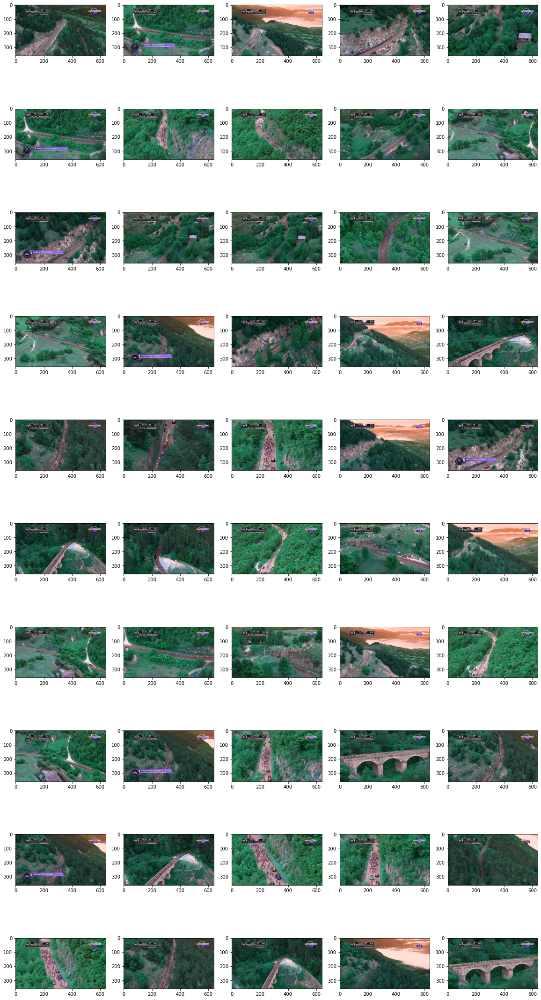

In [23]:
printCluster(1, y_hc)

In [ ]:
printCluster(2, y_hc)

## Building a Model

With this information we can train a model that will classify a image to a given cluster. We will use KNN

In [24]:
def trainTestSave(model, X, y, model_name):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)
    model.fit(X_train, y_train)
    pickle.dump(model, open(model_name, 'wb'))
    return model.score(X_test, y_test)
    
y_hc, features
neigh = KNeighborsClassifier(n_neighbors=hc.n_clusters_)
trainTestSave(neigh, features, y_hc, 'featuresClassifier.md')

0.9967373572593801

In [25]:
y_hc2 = neigh.predict(features)

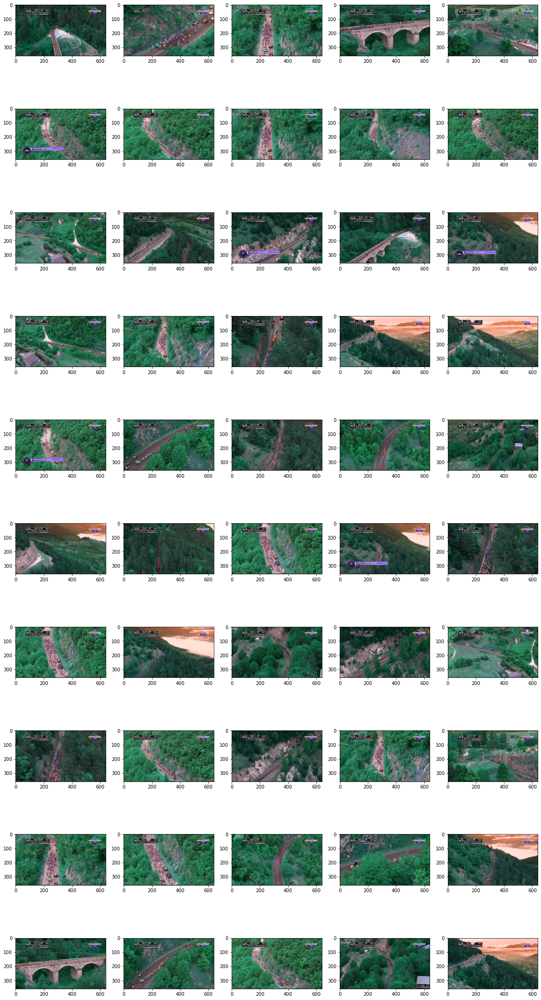

In [26]:
printCluster(1, y_hc2)

## Finding Outliers

After analyzing the plot we pick 3 as the ideal number of clusters and preform the agglomerative clustering. Now we want to identify outliers, meaning images that are very different from the cluster they were assigned to.

Using the boxplot we can see easly identify the outliers and remove them from the data

In [27]:
class OutliersClusterModel:
    
    def __init__(self, centroids, tresholds):
        self.centroids = centroids
        self.tresholds = tresholds        
        
    def train(self, features, clusters):
        #get data for cluster
        self.centroids = []
        self.tresholds = []
        for i, cluster in enumerate(clusters):
            #find center
            center = np.average(features[cluster], axis=0)
            center = center / np.linalg.norm(center)
            #compute distance
            distances = np.linalg.norm(features[cluster] - center, axis = 1, ord = 1)
            #find outlier treshold
            quantiles = np.quantile(distances, [0.25, 0.75])
            iqr = quantiles[1] - quantiles[0]
            toRemove = quantiles[1] + 1.5*iqr
            self.centroids.append(center)
            self.tresholds.append(toRemove)
    
    def remove(self, features, clusters):
        data = []
        outliers = np.array([])
        for i, cluster in enumerate(clusters):
            distances = np.linalg.norm(features[cluster] - self.centroids[i], axis = 1, ord = 1)
            toKeep = distances < self.tresholds[i]
            data.append(cluster[toKeep])
            #outliers.append(cluster[np.logical_not(toKeep)])
            outliers =  np.append(outliers, cluster[np.logical_not(toKeep)])
        return data, outliers
    
outliersModel = OutliersClusterModel([], [])
indexes = [np.array([i for i, y in enumerate(y_hc2) if  y == cluster]) for cluster in range(len(set(y_hc2)))]
outliersModel.train(features, indexes)
keep, remove = outliersModel.remove(features, indexes)
pickle.dump(outliersModel, open('outlierModel.md', 'wb'))

{'whiskers': [<matplotlib.lines.Line2D at 0x7f6874d3d130>,
 'caps': [<matplotlib.lines.Line2D at 0x7f6874d3d670>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f6874d20e20>,
 'medians': [<matplotlib.lines.Line2D at 0x7f6874d3db50>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f6874d3de20>,
 'means': []}

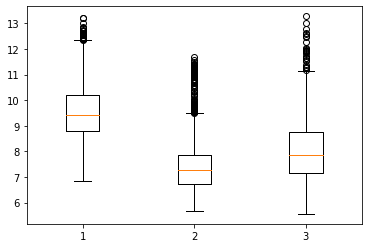

In [28]:
def getClusterDistances(cluster, labels, features):
    indexes = np.array([i for i, y in enumerate(labels) if  y == cluster])
    center = np.average(features[indexes], axis=0)
    center = center / np.linalg.norm(center)
    return np.vstack((indexes, np.linalg.norm(features[indexes] - center, axis = 1, ord = 1))).T

def getOutliers(distancesIndex):
    quantiles = np.quantile(distancesIndex[:,1], [0.25, 0.75])
    iqr = quantiles[1] - quantiles[0]
    toRemove = quantiles[1] + 1.5*iqr
    return distancesIndex[np.where(distancesIndex[:, 1] > toRemove)]

def removeOutliers(distancesIndex):
    quantiles = np.quantile(distancesIndex[:,1], [0.25, 0.75])
    iqr = quantiles[1] - quantiles[0]
    toRemove = quantiles[1] + 1.5*iqr
    return distancesIndex[np.where(distancesIndex[:, 1] < toRemove)]

distances = [getClusterDistances(i, y_hc, features)[:,1] for i in range(hc.n_clusters_)]
plt.boxplot(distances)

In [29]:
#shows best and worst images described in the cluster
clD = getClusterDistances(0, y_hc, features)
clD = clD[clD[:,1].argsort()]
#best_worst = np.append(clD[:25, 0], clD[-25:, 0])
#showImages(video_path, best_worst)

In [30]:
clD = getClusterDistances(0, y_hc, features)
outl = getOutliers(clD)
outl.shape
#showImages(video_path, outl[:,0])

(33, 2)

In [31]:
#clustersIndexes = [removeOutliers(getClusterDistances(i, y_hc, features))[:,0] for i in range(hc.n_clusters_)]
#clustersIndexes
ind = [np.array([i for i, y in enumerate(y_hc2) if  y == cluster]) for cluster in range(len(set(y_hc2)))]
clustersIndexes, remove = outliersModel.remove(features, ind)
clustersIndexes

[array([  51,   52,   53, ..., 8135, 8136, 8137]),
 array([ 905,  906,  907, ..., 8166, 8167, 8168]),
 array([   0,    1,    2, ..., 7897, 7898, 7899])]

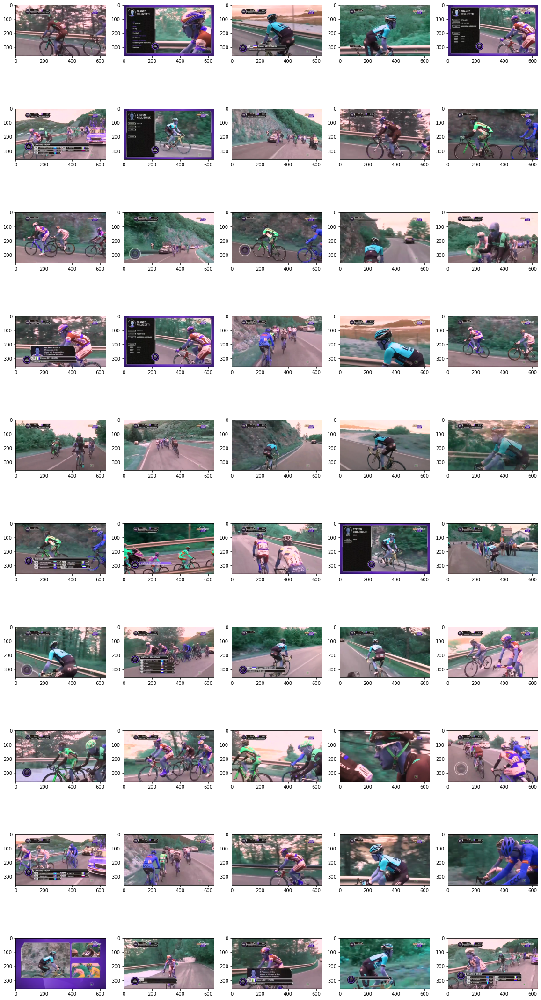

In [32]:
showImages(video_path, np.random.choice(clustersIndexes[0], 50))

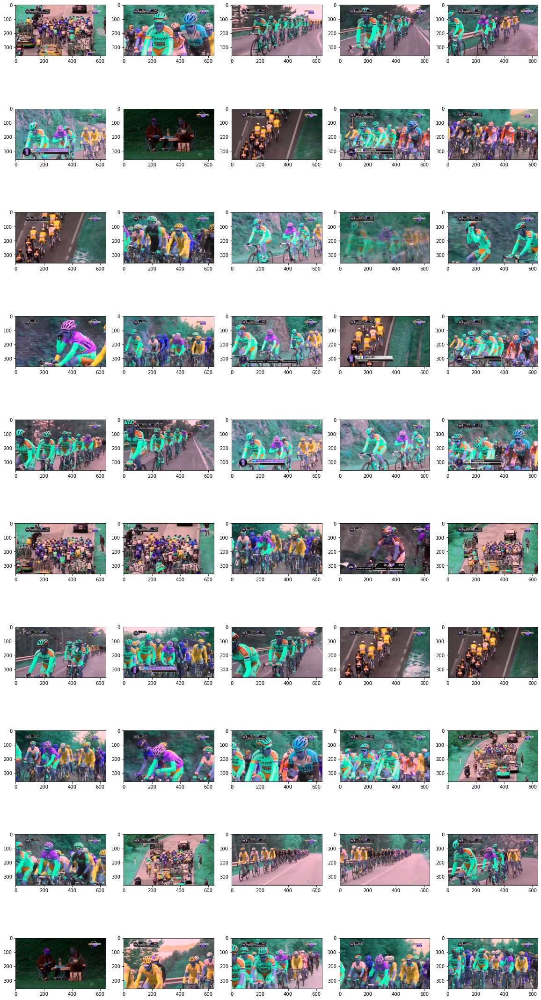

In [33]:
showImages(video_path, np.random.choice(clustersIndexes[2], 50))

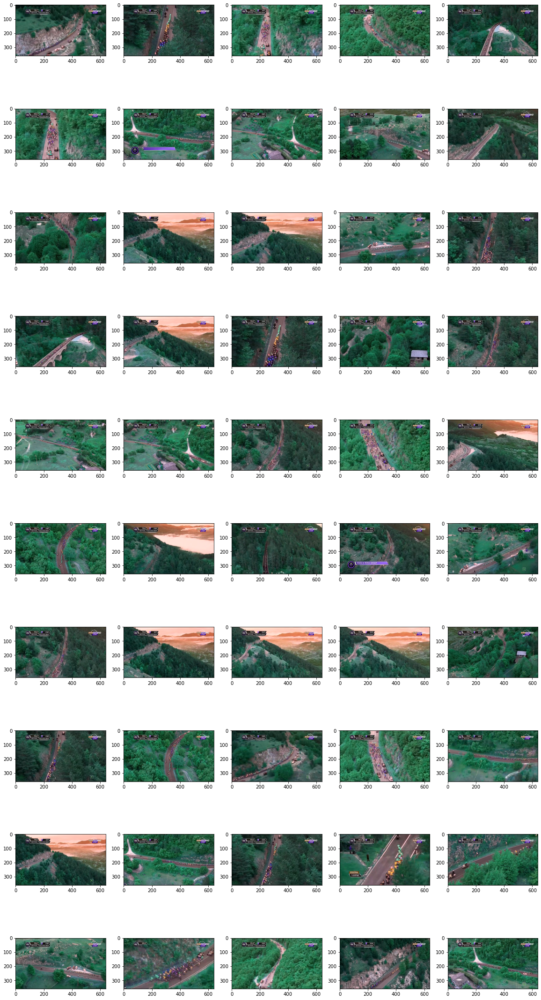

In [34]:
showImages(video_path, np.random.choice(clustersIndexes[1],50))

## Conclusion

In this section we used the image embedding to cluster the data and eliminate outliers, we were able to already find a meaningful classification to part of the data, the Aerial shot. We proceed to analyze the remaining clusters, particularly the Pose part.

# Part 2 - Dealing With Missing Data

As explained, the Pose part of the image can have missing fields, our job in this section is to try to fill this missings spots.

First we will keep only the coordinate data from the skeleton and then we will try to reconstruct it.

In [35]:
missingSkeletons = mat1['skeldata'].T
completeSkeletons = mat2['skeldata'].T

#To remove the probabilities and frame information from the skeletons
def extractSkelCoord(skeletons):
    probabilities = np.full(skeletons.shape[1], True)
    probabilities[::3] = False
    skelsCords = skeletons[:,probabilities]
    return skelsCords

def getDataInCluster(skeletons, clusterIndex):
    cl = pd.DataFrame(clusterIndex)
    skel = pd.DataFrame(skeletons)
    dataInCluster = skel.merge(right=cl, left_on=0, right_on=0, how="inner")
    return dataInCluster.to_numpy()

skeletonsUsedFull = getDataInCluster(missingSkeletons, np.append(clustersIndexes[0], clustersIndexes[2]))

skeletonsUsed = extractSkelCoord(skeletonsUsedFull)
skelsCords = extractSkelCoord(missingSkeletons)
completeSkels = extractSkelCoord(completeSkeletons)

skelsCords[np.where(skelsCords == 0)] = np.nan
skeletonsUsed[np.where(skeletonsUsed == 0)] = np.nan

#probabilities
#skeletonsComplete1 = getDataInCluster(mat2["skeldata"].T, clustersIndexes[0])
#skels = missingSkeletons[:, 1:]
skelsCords.shape, completeSkels.shape, skeletonsUsed.shape

((17326, 36), (17326, 36), (17199, 36))

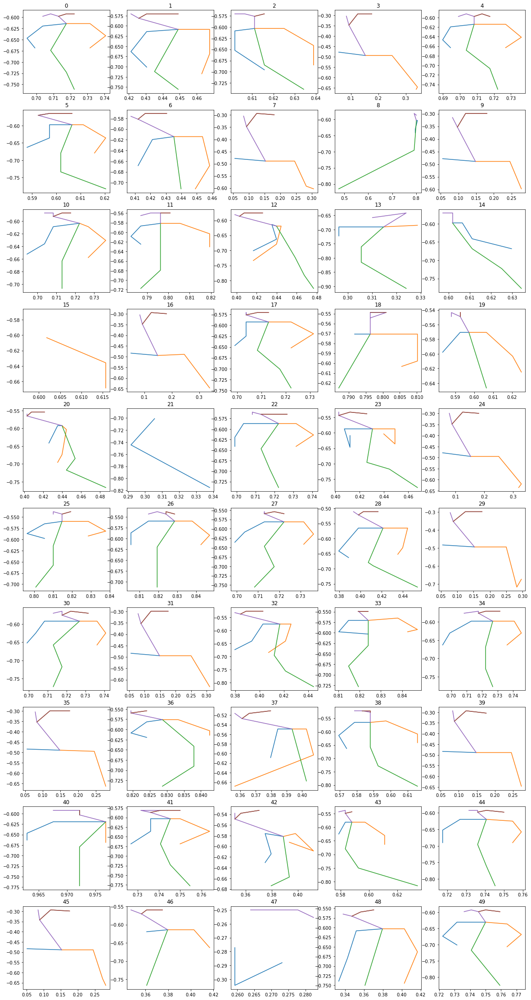

In [39]:
def removeMissingData(vect1, vect2):
    to_remove = np.logical_not(np.isnan(vect1))
    return vect1[to_remove], vect2[to_remove]

        
def printSkeleton(sk,axes):
    x = sk[::2]
    y = -sk[1::2]
    
    rightArm1, rightArm2 = removeMissingData(x[[1,2,3,4]],y[[1,2,3,4]])
    leftArm1, leftArm2 = removeMissingData(x[[1,5,6,7]],y[[1,5,6,7]])
    rigthLeg1, rigthLeg2 = removeMissingData(x[[1,8,9,10]],y[[1,8,9,10]])
    leftLeg1, leftLeg2 = removeMissingData(x[[1,11,12,13]],y[[1,11,12,13]])
    rightHead1, rightHead2 = removeMissingData(x[[16,14,0,1]],y[[16,14,0,1]])
    leftLeg1, leftLeg2 = removeMissingData(x[[0,15,17]],y[[0,15,17]])
    
    axes.plot(rightArm1, rightArm2)
    axes.plot(leftArm1, leftArm2)
    axes.plot(rigthLeg1, rigthLeg2)
    axes.plot(leftLeg1,leftLeg2)
    axes.plot(rightHead1, rightHead2)
    axes.plot(leftLeg1, leftLeg2)
    axes.scatter([0], [0])
    
    #plt.legend()
    return 
    
def showSkeletons(skeletons :list, indices_P : list, rows=10, cols=5):
    img_count = 0
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,40))
    i = 0
    j = 0
    for i in range(rows):
        for j in range(cols):        
            if img_count < len(indices_P):
                printSkeleton(skeletons[indices_P[img_count]],axes[i,j])
                axes[i, j].set_title(indices_P[img_count])
                img_count+=1

showSkeletons(skeletonsUsed, range(100))

## First Approach: Ping Pong

We first try to reconstruct the data with pingpong, but our implementation is too slow

In [80]:
def ping_pong(missingData, rank, error = 0.01):
    D = missingData.copy()
    inds = np.where(np.isnan(D))
    #fill missing data with average
    for i in range(30):
        col_mean = np.nanmean(D, axis=0)
        D[inds[0], inds[1]] = col_mean[inds[1]]
        u, s, vh = np.linalg.svd(D)
        newD = u[:,:rank] @ np.diag(s[:rank]) @ vh[:rank,]
        if np.linalg.norm(newD - D) < error:
            D = newD
            break
        D = newD
        print(i)
    missingData[inds[0], inds[1]] = D[inds[0], inds[1]]
    return missingData
        
    #newD = u[,:rank] 
#teste
D = ping_pong(teste, 10)
#teste[inds] = np.take(col_mean, inds[1])
#teste

NameError: name 'teste' is not defined

In [40]:
#def cart2pol(x, y):
#    rho = np.sqrt(x**2 + y**2)
#    phi = np.arctan2(y, x)
#    return(rho, phi)

#def pol2cart(rho, phi):
#    x = rho * np.cos(phi)
#    y = rho * np.sin(phi)
#    return(x, y)
def centerSkels(skels):
    noFirstPoint = np.where(np.logical_not(np.isnan(skels[:,2])))
    centerData = skels[noFirstPoint].copy()
    #print(centerData[:,::2].shape, centerData[:,2].reshape(-1, 1).shape)
    centerData[:,::2] -= centerData[:,2].reshape(-1, 1)
    centerData[:,1::2] -= centerData[:,3].reshape(-1, 1)
    return centerData, noFirstPoint
centerData, notRemoved  = centerSkels(skeletonsUsed)
skeletonsUsedFull = skeletonsUsedFull[notRemoved]

## Second Approach: GLRM

We choose to construct a GLRM model for the skeleton data. Then we apply the model to the data and it should be able to reconstruct it

In [41]:
h2o.init('http://localhost:54321')

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.15" 2022-04-19; OpenJDK Runtime Environment (build 11.0.15+10-Ubuntu-0ubuntu0.20.04.1); OpenJDK 64-Bit Server VM (build 11.0.15+10-Ubuntu-0ubuntu0.20.04.1, mixed mode, sharing)
  Starting server from /opt/conda/lib/python3.9/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpyvsim9on
  JVM stdout: /tmp/tmpyvsim9on/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpyvsim9on/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.1.2
H2O_cluster_version_age:,"28 days, 1 hour and 42 minutes"
H2O_cluster_name:,H2O_from_python_unknownUser_2xrswt
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.096 Gb
H2O_cluster_total_cores:,12
H2O_cluster_allowed_cores:,12
H2O_cluster_status:,"locked, healthy"


In [42]:
glrm_model = H2OGeneralizedLowRankEstimator(k=8, #upper estimate of the data rank
                                            loss="quadratic",
                                            gamma_x=0.5,#default 0.5
                                            gamma_y=1,
                                            max_iterations=1700,#default 700
                                            #recover_svd=True,
                                            init="SVD",
                                            #max_runtime_secs = 10,
                                            impute_original=True,#default false - 
                                            transform="normalize")#normalizations

In [43]:
usableIndexes = np.where(np.bincount(np.where(np.isnan(centerData))[0]) < 20)
centerData[usableIndexes].shape

(14044, 36)

In [44]:
D_Full = h2o.H2OFrame(skelsCords, column_types = ['real' for i in range(36)])
D_UsefullFrame = h2o.H2OFrame(centerData[usableIndexes], column_types = ['real' for i in range(36)])
D_UsefullFrame
#inds[np.where(inds > 8)]

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15,C16,C17,C18,C19,C20,C21,C22,C23,C24,C25,C26,C27,C28,C29,C30,C31,C32,C33,C34,C35,C36
-0.00462961,-0.0163044,0,0,-0.0138889,0.00543475,-0.0231482,0.0326087,-0.0185185,0.0543478,0.0138889,0,0.0231481,0.0271739,0.0138889,0.0543478,-0.00925928,0.0597826,0,0.108696,0.00462961,0.146739,0.00925928,0.0597826,0.00925928,0.103261,0.0138889,0.146739,-0.00925928,-0.0217391,0,-0.0217391,-0.0138889,-0.0163044,0.00462961,-0.0217391
-0.0231481,-0.0271739,0,0,-0.0185185,0.00543481,-0.0277778,0.0543479,-0.0185185,0.0923913,0.0185185,0,0.0185185,0.0597826,0.0138889,0.108696,-0.0138889,0.103261,0,0.146739,nan,nan,0.00925928,0.103261,0.0231481,0.141304,0.0324074,0.201087,-0.0277778,-0.0380434,-0.0185185,-0.0380434,nan,nan,0,-0.0380434
0,-0.0271739,0,0,-0.00925922,0.00543475,-0.00925922,0.0489131,0.00462961,0.0923913,0.0138889,0,0.0277778,0.0380435,0.0277778,0.0815217,0.00462961,0.0815217,0.0231482,0.13587,nan,nan,0.0231482,0.0760869,0.037037,0.13587,0.0416667,0.184783,-0.00462961,-0.0326087,0.00462961,-0.0326087,-0.00925922,-0.0326087,0.00462961,-0.0326087
-0.0601852,-0.146739,0,0,-0.0972222,-0.0163043,nan,nan,nan,nan,0.0972222,0,0.189815,0.152174,0.185185,0.163043,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.0694444,-0.190217,-0.0277778,-0.201087,nan,nan,0.0231481,-0.201087
0,-0.0163044,0,0,-0.0138889,0.00543475,-0.0185185,0.0326087,-0.0138889,0.0489131,0.0185186,0,0.0277778,0.0271739,0.0185186,0.0489131,-0.00462961,0.0543478,0.00925928,0.0923913,0.0138889,0.13587,0.0138889,0.0543478,0.0138889,0.0923913,0.0231482,0.130435,-0.00462961,-0.0217391,0.00462967,-0.0217391,-0.00925922,-0.0163044,0.00925928,-0.0163044
-0.0138889,-0.0271739,0,0,-0.00925928,0,-0.00925928,0.0380435,-0.0185185,0.0652174,0.00462961,0,0.0138889,0.0380435,0.00925922,0.0815217,-0.00462961,0.0815217,-0.00462961,0.13587,0.0138889,0.184783,0.00925922,0.076087,0.00925922,0.13587,0.0231481,0.184783,-0.00925928,-0.0326087,-0.00925928,-0.0326087,nan,nan,0,-0.0326087
-0.0231481,-0.0326087,0,0,-0.0138889,0.00543475,-0.0231481,0.0543478,nan,nan,0.0185185,0,0.0231481,0.0543478,0.0138889,0.0978261,0.00462961,0.0978261,nan,nan,nan,nan,0.0185185,0.0978261,0.0231481,0.141304,0.037037,0.206522,-0.0277778,-0.0380435,-0.0185185,-0.0434783,nan,nan,-0.00462964,-0.0434783
-0.0601852,-0.141304,0,0,-0.0972222,-0.0108696,nan,nan,nan,nan,0.0925926,0,0.12963,0.103261,0.152778,0.11413,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.0694444,-0.184783,-0.0277778,-0.195652,nan,nan,0.0277778,-0.190217
-0.00925922,-0.0217391,0,0,0.00462967,0,-0.00462961,0.0271739,-0.00462961,0.0380435,nan,nan,nan,nan,nan,nan,-0.00462961,0.0489131,-0.00925922,0.0923913,-0.324074,0.211957,-0.00925922,0.0489131,-0.0138889,0.0869565,nan,nan,nan,nan,nan,nan,0,-0.0163044,nan,nan
-0.0138889,-0.0108696,0,0,-0.0138889,0.00543475,-0.0185185,0.0326087,-0.0277778,0.0489131,0.00462967,0.00543475,0.0138889,0.0271739,0.00462967,0.0543478,-0.00925922,0.0597826,-0.00925922,0.103261,nan,nan,0.00462967,0.0597826,0,0.103261,0.0138889,0.13587,-0.0138889,-0.0163044,-0.00925922,-0.0163044,-0.0185185,-0.0163044,-0.00462961,-0.0163044


In [45]:
glrm_model.train(training_frame=D_UsefullFrame)

glrm Model Build progress: |

/opt/conda/lib/python3.9/site-packages/h2o/estimators/estimator_base.py:208: RuntimeWarning: Dropping bad and constant columns: [C3, C4]
  warnings.warn(mesg["message"], RuntimeWarning)


█████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLowRankEstimator :  Generalized Low Rank Modeling
Model Key:  GLRM_model_python_1656001978818_1


Model Summary: 


,,number_of_iterations,final_step_size,final_objective_value
0,,1000.0,0.484974,161.024633




ModelMetricsGLRM: glrm
** Reported on train data. **

MSE: NaN
RMSE: NaN
Sum of Squared Error (Numeric): 62.76038357823312
Misclassification Error (Categorical): 0.0

Scoring History: 


,,timestamp,duration,iterations,step_size,objective
0,,2022-06-23 16:33:20,2.256 sec,0.0,1.050000,280.305678
1,,2022-06-23 16:33:20,2.335 sec,1.0,1.102500,253.192349
2,,2022-06-23 16:33:20,2.425 sec,2.0,1.157625,252.922879
3,,2022-06-23 16:33:20,2.510 sec,3.0,0.771750,252.922879
4,,2022-06-23 16:33:20,2.595 sec,4.0,0.514500,252.922879
5,,2022-06-23 16:33:20,2.670 sec,5.0,0.540225,234.523265
6,,2022-06-23 16:33:20,2.720 sec,6.0,0.567236,228.157393
7,,2022-06-23 16:33:20,2.772 sec,7.0,0.595598,224.599422
8,,2022-06-23 16:33:20,2.848 sec,8.0,0.625378,221.814648
9,,2022-06-23 16:33:20,2.902 sec,9.0,0.656647,219.452091



See the whole table with table.as_data_frame()


In [46]:
reconstructSkels = centerData[usableIndexes].copy()
D = glrm_model.predict(D_UsefullFrame).as_data_frame(use_pandas=True).to_numpy()
D = np.hstack((D[:,:2], np.zeros((D.shape[0], 2)), D[:,2:]))
reconstructSkels[np.isnan(reconstructSkels)] = D[np.isnan(reconstructSkels)]
#showSkeletons(reconstructSkels, range(100))
reconstructSkels.shape

glrm prediction progress: |██████████████████████████████████████████████████████| (done) 100%


(14044, 36)

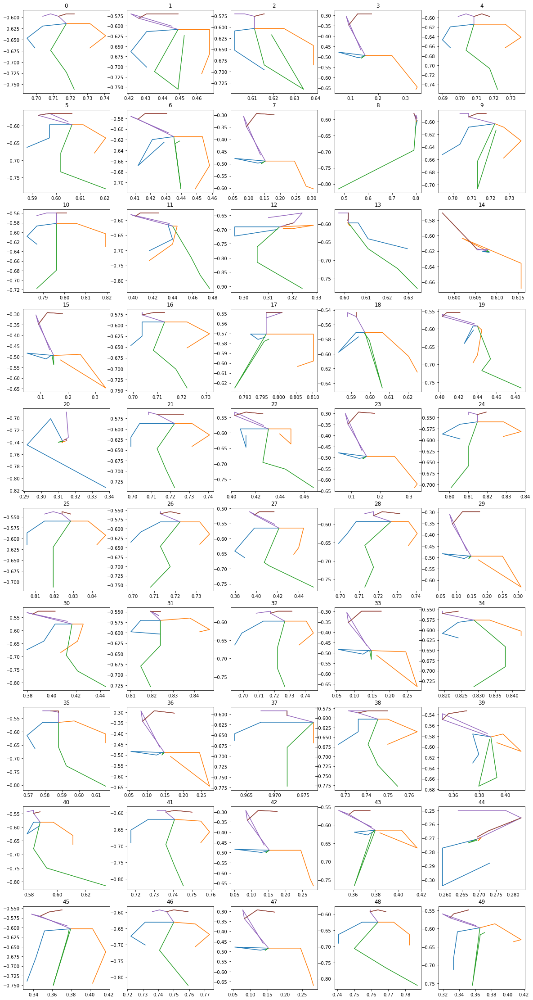

In [47]:
showSkeletons(completeSkels[usableIndexes], range(100))

In [395]:
h2o.save_model(model=glrm_model, path='.', force=True)

'/home/jovyan/GLRM_model_python_1655889296079_9'

# Part 4 - Classification

Classify the data based on the Pose and on the Embeddings.

We start by processing the data from the dataset to aquire the skeleton coordinates that correspond to the embedings clusters.

In [51]:
def getPhiPolar(cords):
    return np.arctan2(cords[:,1::2], cords[:,::2])

phi = getPhiPolar(skels_to_classify)

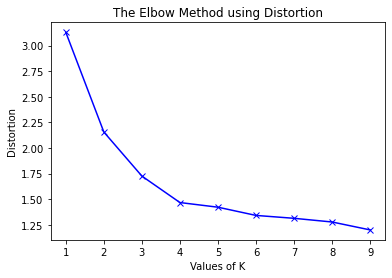

In [50]:
from scipy.spatial.distance import cdist

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)
  
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(phi)
    kmeanModel.fit(phi)
  
    distortions.append(sum(np.min(cdist(phi, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / phi.shape[0])
    inertias.append(kmeanModel.inertia_)
  
    mapping1[k] = sum(np.min(cdist(phi, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / phi.shape[0]
    mapping2[k] = kmeanModel.inertia_

plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

## Centroids

After analizing random skeletons from the dataset, we picked 4 different views (left,front,right,back) to be our centroids

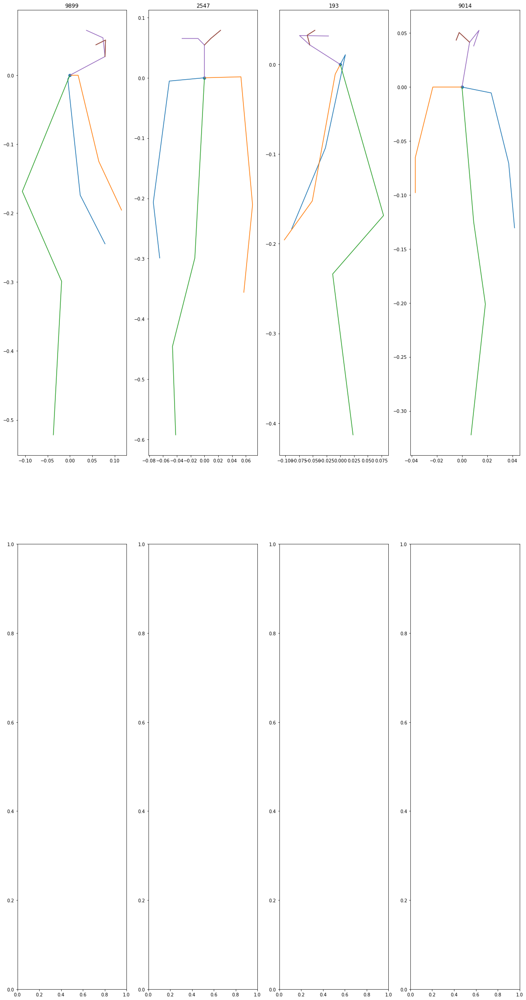

In [388]:
centroids = skels_to_classify[[9899,2547,193,9014]]
showSkeletons(skels_to_classify,[9899,2547,193,9014],rows=2,cols=4)

We now use KMeans to get the clusters so we can then remove the outliers and get the indexes of all the skeletons from each cluster

In [52]:
#centered clean skels
skels_to_classify = reconstructSkels.copy()
#get phi from polar
centroids = getPhiPolar(skels_to_classify[[9899,2547,903,9014]])

skl_kmeans = KMeans(n_clusters = 4, init = centroids)
clusters = skl_kmeans.fit_predict(phi)
pickle.dump(skl_kmeans, open('imagesClassifier.md', 'wb'))

/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1146: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


In [54]:
clustersWsklID = [removeOutliers(getClusterDistances(i, clusters, reconstructSkels))[:,0] for i in range(len(set(clusters)))]
cl_IDs=[clustersWsklID[1],clustersWsklID[3],np.append(clustersWsklID[0], clustersWsklID[2])]
cl_IDs#indexes of all clusters (frontal,rear,lateral)-> in this clustersWsklID

[array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 1.3987e+04, 1.3990e+04,
        1.3991e+04]),
 array([8.0000e+00, 6.3000e+01, 1.2200e+02, ..., 1.4041e+04, 1.4042e+04,
        1.4043e+04]),
 array([1.3000e+01, 2.2900e+02, 3.7300e+02, ..., 1.3905e+04, 1.3915e+04,
        1.3983e+04])]

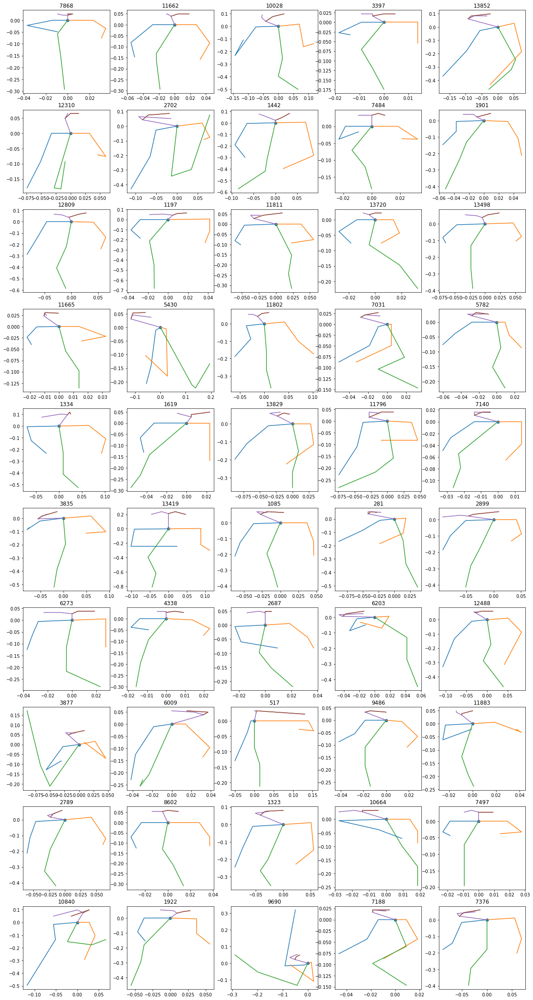

In [55]:
#Skeletons that are facing the camera (front)
showSkeletons(reconstructSkels, np.random.choice(cl_IDs[0], 50).astype(int))

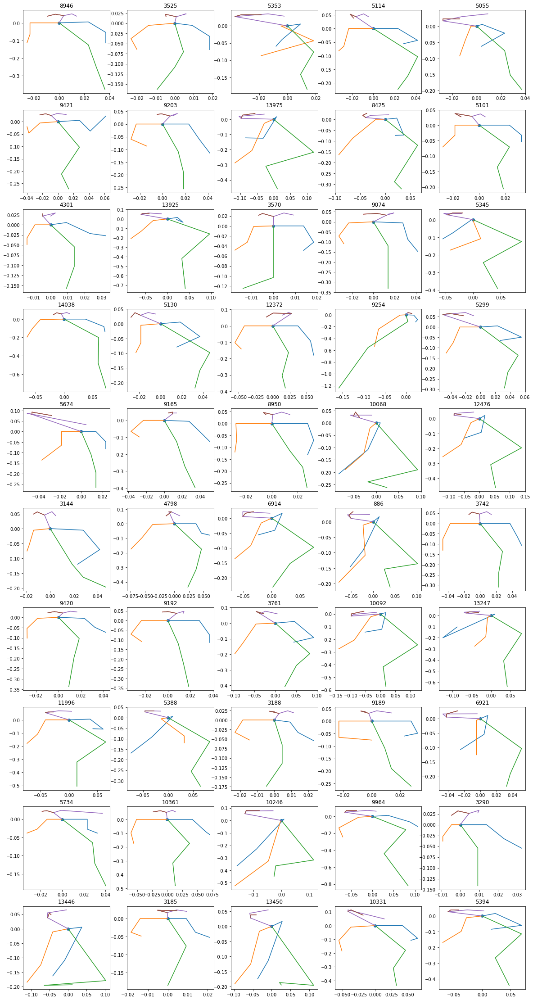

In [56]:
#Skeletons that are not facing the camera (back)
showSkeletons(reconstructSkels, np.random.choice(cl_IDs[1], 50).astype(int))

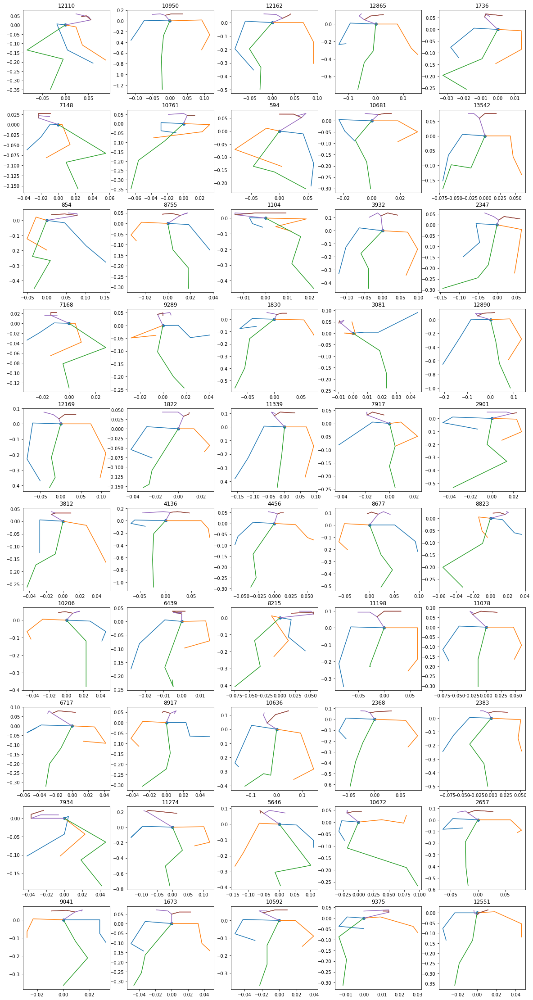

In [57]:
#Skeletons filmed from the side (lateral)
showSkeletons(reconstructSkels, np.random.choice(cl_IDs[2], 50).astype(int))

## Classification

Now we classify each frame according to the clusters of the embedings and the skeletons data

In [192]:
def classifyEmbedings(frames,embedingsClusterIds):
    
    frames[embedingsClusterIds[1].astype(int),0] = 0 #"Aerial view"
    frames[embedingsClusterIds[0].astype(int),0] = 1 #"Individuals view"
    frames[embedingsClusterIds[2].astype(int),0] = 2 #"Peloton view"
    
    return frames

def classify(clustersIndexes,cl_IDs,skeletonis):
    
    #Init frames array for the classification
    nbrImages=9000
    nbrSkeletons = 18000
    frames = np.full((nbrImages,2),-1)
    
    skels = np.full(skeletonis.shape[0],-1)
    #Init frames array for the classification
    skels[cl_IDs[0].astype(int)] = 0 #"front"
    skels[cl_IDs[1].astype(int)] = 1 #"back"
    skels[cl_IDs[2].astype(int)] = 2 #"lateral"

    frames = classifyEmbedings(frames,clustersIndexes)
#def classifySkeletons(frames,cl_IDs,sk):
    
    #Iterate all frames
    for i in range(len(frames)):
    
        #Get all skeletons from the frame
        skelsInFrameIDs = np.where(skl_forclass[:,0] == i)
        skelis = skels[skelsInFrameIDs]
        valid = np.where(skelis!=-1)
        if valid[0].size != 0:
            frames[i,1] = np.bincount(skelis[valid[0]]).argmax()
    
    return frames
        
frames = classify(clustersIndexes,cl_IDs,skl_forclass)
frames

array([[ 2,  2],
       [ 2,  2],
       [ 2,  2],
       ...,
       [-1, -1],
       [-1, -1],
       [-1, -1]])